# COVID Analysis - Intro to Pandas

This uses a county level timeseries dataset provided by:  https://usafacts.org/visualizations/coronavirus-covid-19-spread-map/ 

You can use curl to fetch the 2 files or download manually.

- curl https://static.usafacts.org/public/data/covid-19/covid_confirmed_usafacts.csv -o usa-confirmed.csv   
- curl https://static.usafacts.org/public/data/covid-19/covid_deaths_usafacts.csv -o usa-deaths.csv


In [255]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

dfc = pd.read_csv('USAfacts/usa-confirmed.csv', encoding='latin')   # latin-1 is western charsets
dfd = pd.read_csv('USAfacts/usa-deaths.csv', encoding='latin')      # typically dont need this parameter

display('dfc, dfd shapes: ' + str(dfc.shape) +', '+ str(dfd.shape) )
dfc.head(3)


'dfc, dfd shapes: (1403, 67), (1403, 67)'

,countyFIPS,County Name,State,stateFIPS,1/22/2020,1/23/2020,1/24/2020,1/25/2020,1/26/2020,1/27/2020,...,3/15/2020,3/16/2020,3/17/2020,3/18/2020,3/19/2020,3/20/2020,3/21/2020,3/22/2020,3/23/2020,3/24/2020
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,1,1,1,1,1,2,2,3,3,4


In [ ]:

dfc['count'] = dfc.iloc[:,-1]
dfd['count'] = dfd.iloc[:,-1]

display(dfc[dfc['State']=='NY'].iloc[:,-3:].head(2))

display(dfc[dfc['State']=='NY'][['countyFIPS','County Name', 'State','stateFIPS',prev_dt,'count']].head(2))
display(dfd[dfc['State']=='NY'][['countyFIPS','County Name', 'State','stateFIPS',prev_dt,'count']].head(2))



In [227]:
# join data (assume keys are stable between both files, otherwise join on named key)

display(dfd[dfd['count'] > 0 ][66:69])
dfc['deathcount'] = dfd['count']
dfc[66:69]

,countyFIPS,County Name,State,stateFIPS,1/22/2020,1/23/2020,1/24/2020,1/25/2020,1/26/2020,1/27/2020,...,3/16/2020,3/17/2020,3/18/2020,3/19/2020,3/20/2020,3/21/2020,3/22/2020,3/23/2020,3/24/2020,count
373,18035,Delaware County,IN,18,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,1,1
389,18081,Johnson County,IN,18,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,3,3
394,18097,Marion County,IN,18,0,0,0,0,0,0,...,1,1,1,1,2,2,3,3,3,3


,countyFIPS,County Name,State,stateFIPS,1/22/2020,1/23/2020,1/24/2020,1/25/2020,1/26/2020,1/27/2020,...,3/17/2020,3/18/2020,3/19/2020,3/20/2020,3/21/2020,3/22/2020,3/23/2020,3/24/2020,count,deathcount
66,5069,Jefferson County,AR,5,0,0,0,0,0,0,...,5,5,10,11,19,20,21,22,22,0
67,5079,Lincoln County,AR,5,0,0,0,0,0,0,...,1,1,1,1,1,2,2,3,3,0
68,5111,Poinsett County,AR,5,0,0,0,0,0,0,...,0,0,1,1,1,3,3,2,2,0


In [228]:
# sum by state hmm.. why is deathcount NaN...

dfc.groupby( ['State']).sum().loc[['NY','CA','NC','NJ'],[prev_dt,'count','deathcount']]

,3/23/2020,count,deathcount
State,,,
NY,20877,26399,226
CA,2253,2642,52
NC,291,398,0
NJ,2851,3675,44


In [229]:
# group & sort by biggest changes
dfdelta = dfc.groupby(['State']).sum().loc[:,[prev_dt,'count','deathcount']]
dfdelta['daily change'] = dfdelta['count'] - dfdelta[prev_dt]
dfdelta['daily change %'] = (dfdelta['daily change'] / dfdelta[prev_dt])*100
dfdelta = dfdelta[dfdelta['daily change %'] != np.inf]

dfdelta = dfdelta.rename(columns={'count': 'latest count'})
display(dfdelta.sort_values(by=['daily change %'], ascending=False).head(10))
display(dfdelta.sort_values(by=['daily change'], ascending=False).head(10))

# by county removing small counties
dfdelta = dfc.groupby(['State','County Name']).sum().loc[:,[prev_dt,'count','deathcount']]
dfdelta['daily change'] = dfdelta['count'] - dfdelta[prev_dt]
dfdelta['daily change %'] = (dfdelta['daily change'] / dfdelta[prev_dt])*100
dfdelta = dfdelta[dfdelta['daily change %'] != np.inf]
dfdelta = dfdelta[dfdelta[prev_dt] > 5]

dfdelta = dfdelta.rename(columns={'count': 'latest count'})
display(dfdelta.sort_values(by=['daily change %'], ascending=False).head(10))
display(dfdelta.sort_values(by=['daily change'], ascending=False).head(10))

dfdelta.sum()



,3/23/2020,latest count,deathcount,daily change,daily change %
State,,,,,
WV,20,38,0,18,90.000000
MA,777,1159,11,382,49.163449
CT,415,618,12,203,48.915663
ID,50,73,1,23,46.000000
IN,259,361,9,102,39.382239
MO,183,255,6,72,39.344262
AZ,234,326,5,92,39.316239
GA,799,1097,38,298,37.296621
NC,291,398,0,107,36.769759


,3/23/2020,latest count,deathcount,daily change,daily change %
State,,,,,
NY,20877,26399,226,5522,26.450160
NJ,2851,3675,44,824,28.902140
MI,1328,1791,24,463,34.864458
CA,2253,2642,52,389,17.265868
MA,777,1159,11,382,49.163449
IL,1285,1603,16,318,24.747082
GA,799,1097,38,298,37.296621
WA,2221,2469,123,248,11.166141
LA,1170,1394,45,224,19.145299


3/23/2020  latest count  deathcount  \
State County Name                                                  
VA    Arlington County               6            36           0   
TX    McLennan County                7            20           0   
      Fort Bend County              11            29           0   
CA    San Bernardino County         17            38           1   
CT    New Haven County              41            89           0   
PA    Lackawanna County              7            15           1   
      Luzerne County                10            21           0   
TN    Robertson County               6            12           0   
MA    Plymouth County               32            64           0   
VT    Windsor County                 8            15           1   

                             daily change  daily change %  
State County Name                                          
VA    Arlington County                 30      500.000000  
TX    McLennan County                  13      185.714286  
      Fort Bend County                 18      163.636364  
CA    San Bernardino County            21      123.529412  
CT    New Haven County                 48      117.073171  
PA    Lackawanna County                 8      114.285714  
      Luzerne County                   11      110.000000  
TN    Robertson County                  6      100.000000  
MA    Plymouth County                  32      100.000000  
VT    Windsor County                    7       87.500000

3/23/2020  latest count  deathcount  \
State County Name                                                  
NY    New York City              12305         15597         192   
      Westchester County          2894          3891           1   
      Nassau County               2442          2869           7   
      Suffolk County              1458          1880          17   
IL    Cook County                  922          1194          12   
MI    Wayne County                 638           873          13   
NJ    Statewide Unallocated        419           645           3   
NY    Orange County                389           539           0   
CA    Los Angeles County           536           662          11   
CT    Fairfield County             270           384           7   

                             daily change  daily change %  
State County Name                                          
NY    New York City                  3292       26.753352  
      Westchester County              997       34.450587  
      Nassau County                   427       17.485667  
      Suffolk County                  422       28.943759  
IL    Cook County                     272       29.501085  
MI    Wayne County                    235       36.833856  
NJ    Statewide Unallocated           226       53.937947  
NY    Orange County                   150       38.560411  
CA    Los Angeles County              126       23.507463  
CT    Fairfield County                114       42.222222

3/23/2020         41910.000000
latest count      52207.000000
deathcount          688.000000
daily change      10297.000000
daily change %    10530.926737
dtype: float64

In [230]:
display(dfdelta.loc[['NC']].sort_values(by=['daily change %'], ascending=False).head(5))


3/23/2020  latest count  deathcount  daily change  \
State County Name                                                             
NC    Orange County               6            11           0             5   
      Durham County              40            63           0            23   
      Iredell County              6             9           0             3   
      Guilford County            11            16           0             5   
      Mecklenburg County         79           104           0            25   

                          daily change %  
State County Name                         
NC    Orange County            83.333333  
      Durham County            57.500000  
      Iredell County           50.000000  
      Guilford County          45.454545  
      Mecklenburg County       31.645570

## Using PyPlot GeoJSON and ChoroPleth maps

https://plot.ly/python/choropleth-maps/

Install
- pyplot
- pyplot-orca


In [231]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = dfc[['countyFIPS','count','County Name','State','deathcount']].copy()
df['County, ST'] = df['County Name']+', '+df['State']
display(df.shape)

# make FIPS 5 char to match geojson data
df['countyFIPSstr'] = df['countyFIPS'].apply(lambda x: str(x) if x > 9999 else '0'+str(x)) 
df['countLog'] = df['count'].apply(lambda x: np.log(x) if x != 0 else 0)
df['label'] = df['County, ST'] + ': ' + df['count'].astype(str)
df.head()


(1403, 6)

,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr,countLog,label
0,0,0,Statewide Unallocated,AL,0,"Statewide Unallocated, AL",00,0.000000,"Statewide Unallocated, AL: 0"
1,1001,1,Autauga County,AL,0,"Autauga County, AL",01001,0.000000,"Autauga County, AL: 1"
2,1003,4,Baldwin County,AL,0,"Baldwin County, AL",01003,1.386294,"Baldwin County, AL: 4"
3,1015,2,Calhoun County,AL,0,"Calhoun County, AL",01015,0.693147,"Calhoun County, AL: 2"
4,1017,5,Chambers County,AL,0,"Chambers County, AL",01017,1.609438,"Chambers County, AL: 5"


In [232]:
import plotly.express as px

fig = px.choropleth(df, geojson=counties, 
                           locations='countyFIPSstr', 
                           color='countLog',
                           color_continuous_scale="OrRd",
                           range_color=(0,10),
                           scope="usa",
                           hover_name='label',
                           labels={'covis':'covis count'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [233]:

fig.show("svg")


In [234]:
#first 5 digits are fips state+county
cgeo_df = pd.read_csv('maps/safegraph_open_census_data/metadata/cbg_geographic_data.csv', dtype=str)
cgeo_df['countyFIPSstr'] = cgeo_df['census_block_group'].apply(lambda x: str(x)[0:5])
cgeo_df = cgeo_df.astype({'longitude': 'float','latitude': 'float'})

#spot check
display(cgeo_df.head())

cgeo_df = cgeo_df.groupby('countyFIPSstr').agg({'latitude':'max', 'longitude':'max'})

display(cgeo_df.head())
display(df.head())

# remove 00 unmappep/allocated for now
df = df[df['countyFIPSstr'] != '00']

print('dup check should be 0')
display(df.groupby('countyFIPSstr').filter(lambda x: len(x) > 1))

print('join to df2')
df2 = df.join(cgeo_df, on='countyFIPSstr')

df2.head()


,census_block_group,amount_land,amount_water,latitude,longitude,countyFIPSstr
0,010010201001,4254524,23431,32.465829,-86.489614,01001
1,010010201002,5568295,0,32.485849,-86.489690,01001
2,010010202001,2058380,0,32.480082,-86.474974,01001
3,010010202002,1283506,5968,32.464435,-86.469766,01001
4,010010203001,3866515,9054,32.480175,-86.460792,01001


,latitude,longitude
countyFIPSstr,,
01001,32.683609,-86.418657
01003,31.168548,-87.439191
01005,32.068959,-85.113641
01007,33.214580,-86.932756
01009,34.216206,-86.361561


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr,countLog,label
0,0,0,Statewide Unallocated,AL,0,"Statewide Unallocated, AL",00,0.000000,"Statewide Unallocated, AL: 0"
1,1001,1,Autauga County,AL,0,"Autauga County, AL",01001,0.000000,"Autauga County, AL: 1"
2,1003,4,Baldwin County,AL,0,"Baldwin County, AL",01003,1.386294,"Baldwin County, AL: 4"
3,1015,2,Calhoun County,AL,0,"Calhoun County, AL",01015,0.693147,"Calhoun County, AL: 2"
4,1017,5,Chambers County,AL,0,"Chambers County, AL",01017,1.609438,"Chambers County, AL: 5"


dup check should be 0


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr,countLog,label
1215,48183,1,Gregg County,TX,0,"Gregg County, TX",48183,0.0,"Gregg County, TX: 1"
1216,48183,1,Gregg County,TX,0,"Gregg County, TX",48183,0.0,"Gregg County, TX: 1"


join to df2


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr,countLog,label,latitude,longitude
1,1001,1,Autauga County,AL,0,"Autauga County, AL",01001,0.000000,"Autauga County, AL: 1",32.683609,-86.418657
2,1003,4,Baldwin County,AL,0,"Baldwin County, AL",01003,1.386294,"Baldwin County, AL: 4",31.168548,-87.439191
3,1015,2,Calhoun County,AL,0,"Calhoun County, AL",01015,0.693147,"Calhoun County, AL: 2",33.947218,-85.569262
4,1017,5,Chambers County,AL,0,"Chambers County, AL",01017,1.609438,"Chambers County, AL: 5",33.045373,-85.149241
5,1043,3,Cullman County,AL,0,"Cullman County, AL",01043,1.098612,"Cullman County, AL: 3",34.286043,-86.479413


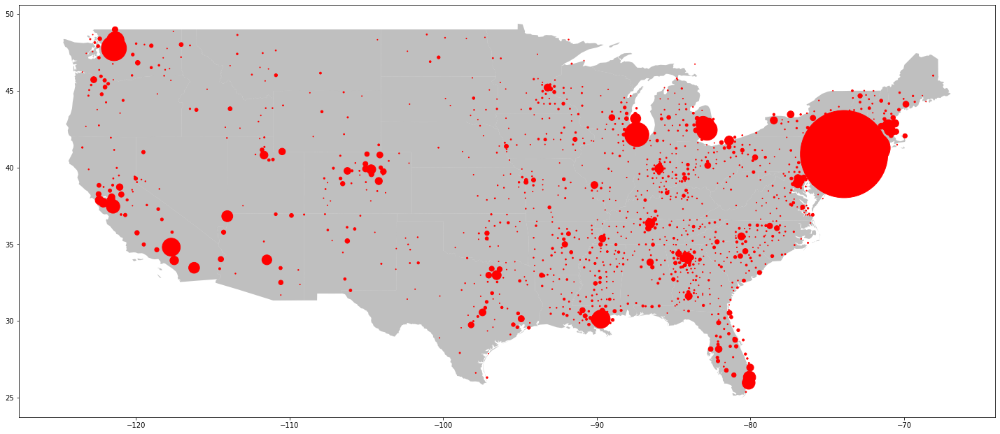

In [235]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

usa = gpd.read_file('maps/states.shp')

# remove hi/ak for now
df2 = df2[~df2['State'].isin(['HI','AK'])]
cusa = usa[~usa['STATE_NAME'].isin(['Hawaii','Alaska'])]

geometry = [Point(xy) for xy in zip(df2["longitude"],df2["latitude"]) ] 
geo_df = gpd.GeoDataFrame(df2,crs={"init": "epsg:4326"},geometry=geometry)
geo_df = geo_df[['County Name','countLog','geometry']]

# display(usa[0:3])
# display(geo_df)

fig, ax = plt.subplots(figsize=(25,25))

cusa.plot(ax=ax, alpha=0.5, color='grey')

#geo_df.plot(ax=ax, markersize=10, cmap='Reds', label='case')
geo_df.plot(ax=ax, markersize=df2['count'], color='red', label='case')

